In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision as tv

In [2]:
# sd of noise applied to image ~ N(0,sigma^2)
sigma = 0.1

# at each iteration we perturb the z with an additive noise ~ N(0,sigma_p^2)
sigma_p = 1./30

# learning rate
lr = 0.01

# To see overfitting set max_iter to a large value and remove stop condition
max_iter = 1800

# Number of channels in the output
nc = 3

# Size of z latent vector (generator input)
nz = 32

# no gpu :(
ngpu = 0

In [3]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

In [4]:
def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return -1
    else:
        return 10 * np.log10(1. / mse)

In [5]:
def intify(I):
    assert I.dtype == np.float32 or I.dtype == np.float64
    J = I * 255.0
    return J.astype(np.uint8)

def floatify(I):
    assert I.dtype == np.uint8
    J = I / 255.0
    return J.astype(np.float32)

### Network

The generator $G$ maps the latent space vector $z$ to data-space.<br>
Essentially, this means creating an image from noise.

Input: z (512x512x3 uniformly distibuted noise)

Output: 512x512x3 image

An image of the network from the paper:
<img src=hourglass.png>

<img src=hyperparameters.png>
d = downsampling

u = upsampling

s = skip-connection

n = number of filters

k = kernel size

$\sigma_p$ = input noise standard deviation

In [6]:
class CBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride):
        super(CBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(negative_slope=0.2, inplace=True)
    
    def forward(self, x):
        
        out = self.conv(x)
        out = self.bn(out)
        out = self.act(out)

        return out

In [7]:
class DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size):
        super(DBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=1, padding_mode='reflect')
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(negative_slope=0.2, inplace=True)
    
    def forward(self, x):
        
        out = self.conv1(x)
        out = self.bn(out)
        out = self.act(out)
        out = self.conv2(out)
        out = self.bn(out)
        out = self.act(out)

        return out

In [8]:
class UBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size):
        super(UBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=1, padding_mode='reflect')
        self.conv2 = nn.Conv2d(out_channels, out_channels, 1, stride=1, padding=0)
        self.bn_in = nn.BatchNorm2d(in_channels)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear')
    
    def forward(self, x):
        
        out = self.bn_in(x)
        out = self.conv1(out)
        out = self.bn(out)
        out = self.act(out)
        out = self.conv2(out)
        out = self.bn(out)
        out = self.act(out)
        out = self.up(out)

        return out

In [9]:
class SBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size):
        super(SBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size)
        self.bn = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(negative_slope=0.1, inplace=True)
    
    def forward(self, x):
        
        out = self.conv(x)
        out = self.bn(out)
        out = self.act(out)

        return out

In [10]:
class Hourglass(nn.Module):
    def __init__(self):
        super(Hourglass, self).__init__()
        self.ngpu = ngpu
        
        # down
        self.d1 = DBlock(nz, 128, 3)
        self.d2 = DBlock(128, 128, 3)
        self.d3 = DBlock(128, 128, 3)
        self.d4 = DBlock(128, 128, 3)
        self.d5 = DBlock(128, 128, 3)
        
        # up
        self.u5 = UBlock(132, 128, 3)
        self.u4 = UBlock(132, 128, 3)
        self.u3 = UBlock(132, 128, 3)
        self.u2 = UBlock(132, 128, 3)
        self.u1 = UBlock(132, 128, 3)
        
        # skip
        self.s1 = SBlock(128, 4, 1)
        self.s2 = SBlock(128, 4, 1)
        self.s3 = SBlock(128, 4, 1)
        self.s4 = SBlock(128, 4, 1)
        self.s5 = SBlock(128, 4, 1)
        
        self.conv = CBlock(128, nc, 1, 1)
        self.output = nn.Sigmoid()
        
    def forward(self, x):
        
        out = self.d1(x)
        skip1 = self.s4(out)
        out = self.d2(out)
        skip2 = self.s4(out)
        out = self.d3(out)
        skip3 = self.s4(out)
        out = self.d4(out)
        skip4 = self.s4(out)
        out = self.d5(out)
        skip5 = self.s5(out)
        
        out = self.u5(torch.cat([out,skip5],1))
        out = self.u4(torch.cat([out,skip4],1))
        out = self.u3(torch.cat([out,skip3],1))
        out = self.u2(torch.cat([out,skip2],1))
        out = self.u1(torch.cat([out,skip1],1))
        
        out = self.conv(out)
        out = self.output(out)
        
        return out

### Image

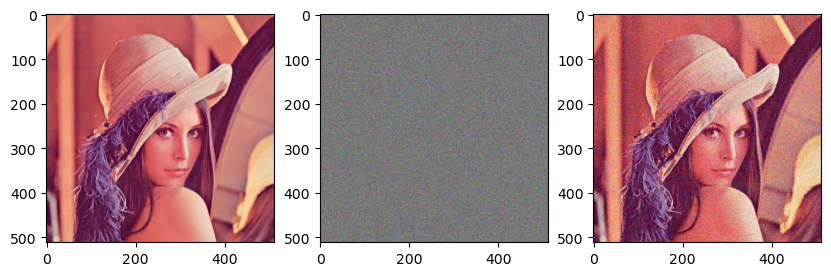

In [11]:
# read image
img = plt.imread('lena.jpg')
if img.dtype == np.uint8:
    img = floatify(img).astype(np.float32) # convert to 32 bit float (0-1)

# generate noisy image
noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
noisy_img = np.clip(img + noise, 0, 1).astype(np.float32)

# convert noisy image to tensor
x = torch.tensor(np.moveaxis(img, -1, 0), requires_grad=True).unsqueeze(0).to(device)
x0 = torch.tensor(np.moveaxis(noisy_img, -1, 0), requires_grad=True).unsqueeze(0).to(device)

# Notes
# .png is read as 0-1 float
# everything else is 0-255 int
# moveaxis changes the order of dimensions (so that it works as a tensor)
# unsqueeze adds a dimension -> (N=1, C=3, H=512, W=512)
# TENSOR.squeeze().detach().cpu().numpy() # convert back to numpy array
# np.moveaxis(numpy_array ,0,-1) # correct axis

# display images
plt.figure(0, figsize=(10,10))
plt.subplot(1, 3, 1); plt.imshow(img)
plt.subplot(1, 3, 2); plt.imshow((noise - noise.min()) / (noise.max() - noise.min()))
plt.subplot(1, 3, 3); plt.imshow(noisy_img)
plt.show()

### Setup

In [12]:
hg_net = Hourglass().to(device)
# print(hg_net)
# hg_net.apply(weights_init)

# number of parameters
s  = sum([np.prod(list(p.size())) for p in hg_net.parameters()]); 
print ('# of params: %d' % s)

# loss
mse = nn.MSELoss()

# net input
z = 0.1 * torch.rand(1, nz, 512, 512, device=device)

# of params: 2215661


### Optimize

iterations: [0/1800]  loss: 0.083451  psnr_gt: 11.226869  psnr_noisy: 10.785709


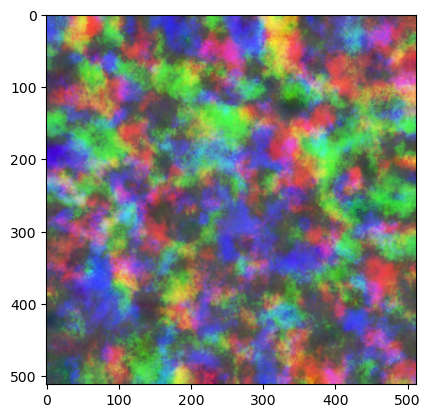

iterations: [10/1800]  loss: 0.042552  psnr_gt: 14.671100  psnr_noisy: 13.710787


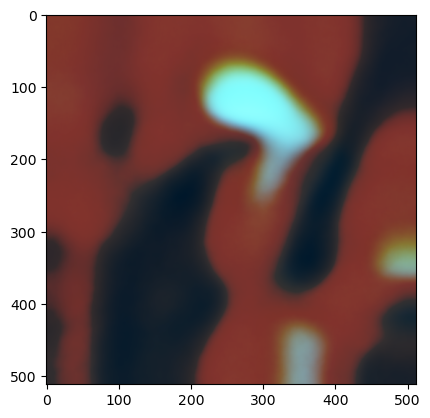

iterations: [20/1800]  loss: 0.036470  psnr_gt: 15.542385  psnr_noisy: 14.380700


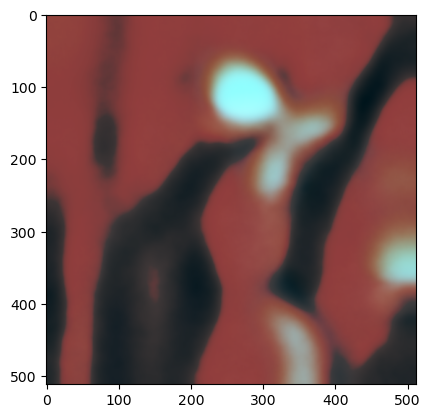

iterations: [30/1800]  loss: 0.032901  psnr_gt: 16.157585  psnr_noisy: 14.827884


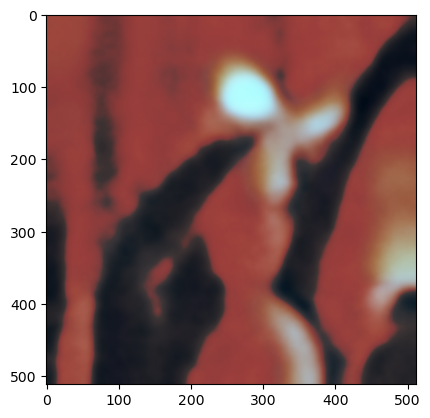

iterations: [40/1800]  loss: 0.029518  psnr_gt: 16.832293  psnr_noisy: 15.299177


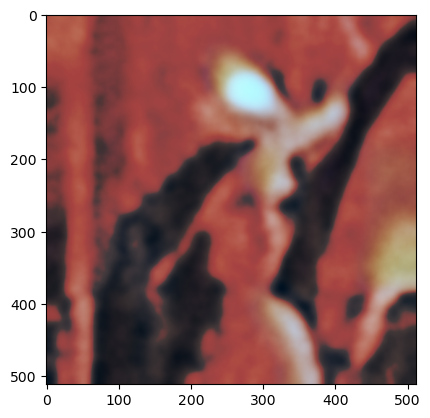

iterations: [50/1800]  loss: 0.027086  psnr_gt: 17.389221  psnr_noisy: 15.672508


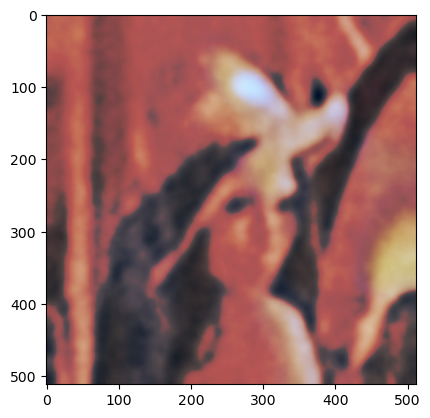

iterations: [60/1800]  loss: 0.025197  psnr_gt: 17.875121  psnr_noisy: 15.986567


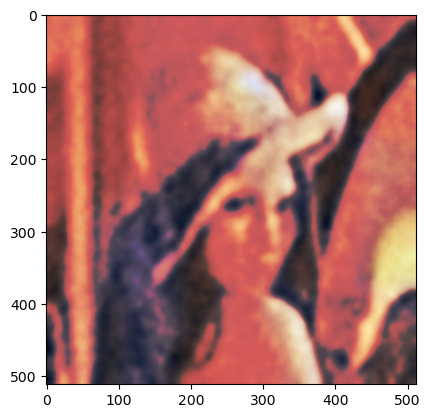

iterations: [70/1800]  loss: 0.023795  psnr_gt: 18.278278  psnr_noisy: 16.235224


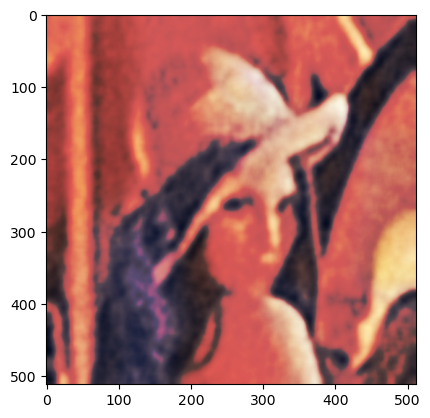

iterations: [80/1800]  loss: 0.022625  psnr_gt: 18.642493  psnr_noisy: 16.454119


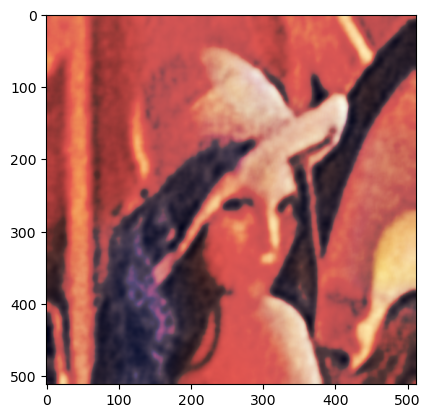

iterations: [90/1800]  loss: 0.021802  psnr_gt: 18.921046  psnr_noisy: 16.615084


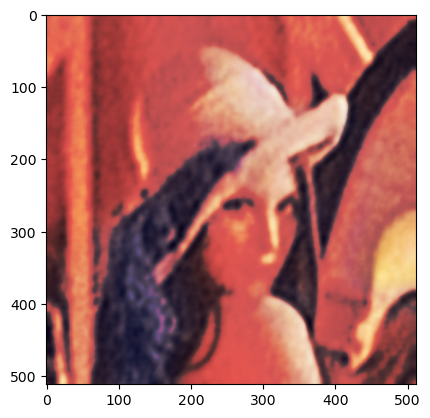

iterations: [100/1800]  loss: 0.020856  psnr_gt: 19.255151  psnr_noisy: 16.807685


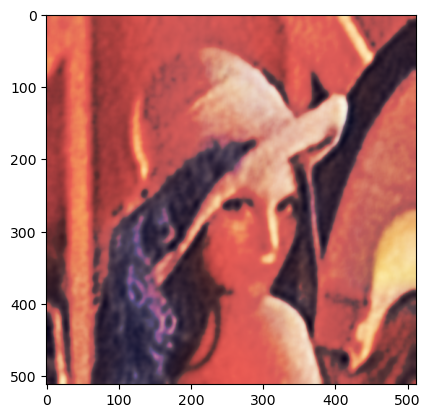

iterations: [110/1800]  loss: 0.019976  psnr_gt: 19.595474  psnr_noisy: 16.994860


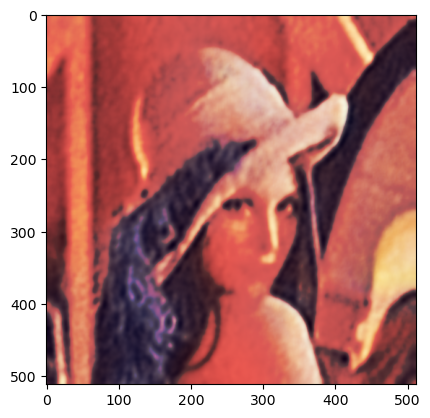

iterations: [120/1800]  loss: 0.019217  psnr_gt: 19.909409  psnr_noisy: 17.163188


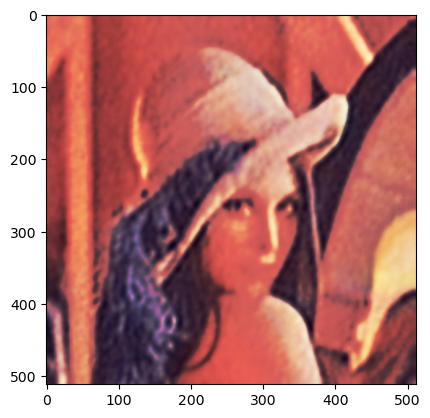

iterations: [130/1800]  loss: 0.018522  psnr_gt: 20.218297  psnr_noisy: 17.323174


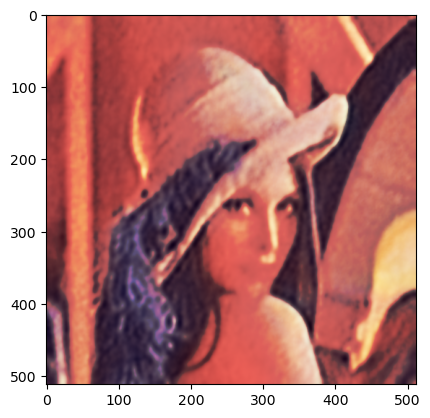

iterations: [140/1800]  loss: 0.017890  psnr_gt: 20.518680  psnr_noisy: 17.473881


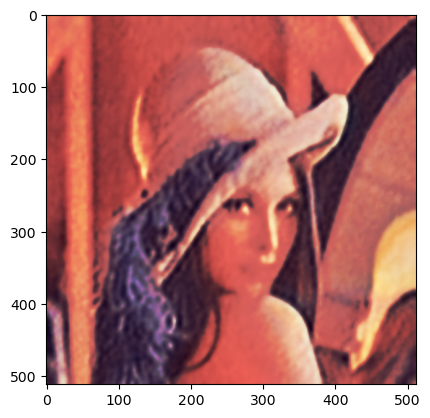

iterations: [150/1800]  loss: 0.017734  psnr_gt: 20.594286  psnr_noisy: 17.511998


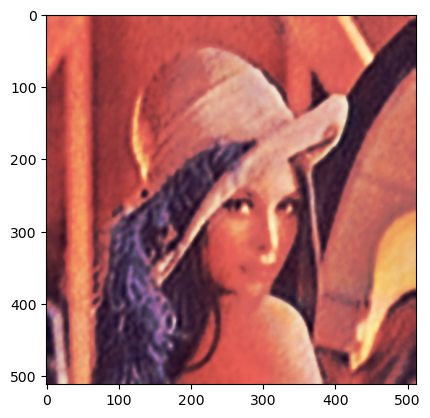

iterations: [160/1800]  loss: 0.016922  psnr_gt: 21.027136  psnr_noisy: 17.715483


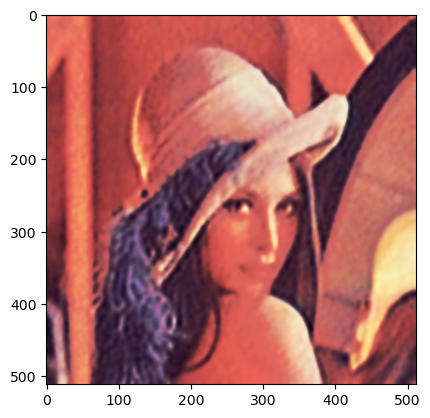

iterations: [170/1800]  loss: 0.016329  psnr_gt: 21.363371  psnr_noisy: 17.870344


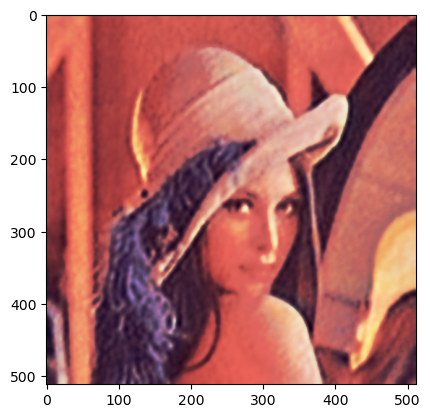

iterations: [180/1800]  loss: 0.015828  psnr_gt: 21.675255  psnr_noisy: 18.005873


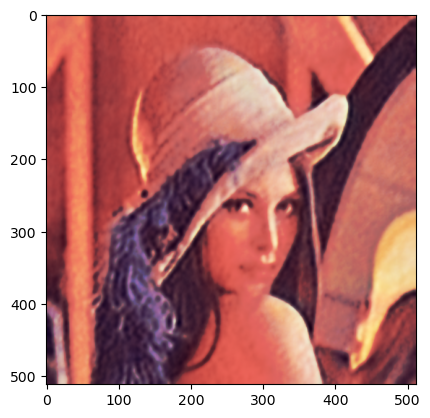

iterations: [190/1800]  loss: 0.015381  psnr_gt: 21.967911  psnr_noisy: 18.130018


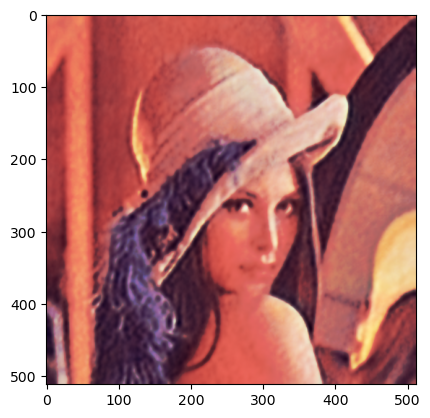

iterations: [200/1800]  loss: 0.015067  psnr_gt: 22.192061  psnr_noisy: 18.219869


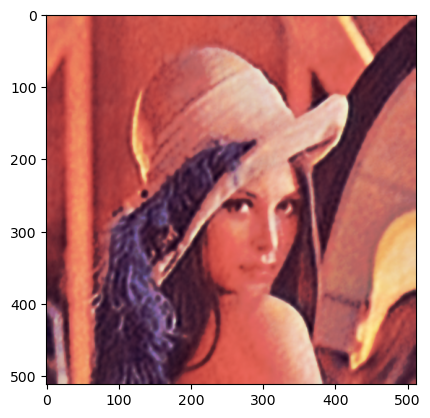

iterations: [210/1800]  loss: 0.014650  psnr_gt: 22.494508  psnr_noisy: 18.341694


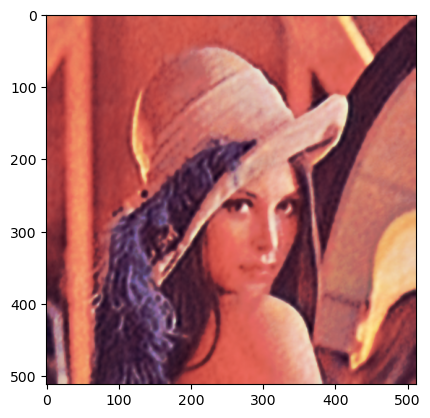

iterations: [220/1800]  loss: 0.014378  psnr_gt: 22.705167  psnr_noisy: 18.422925


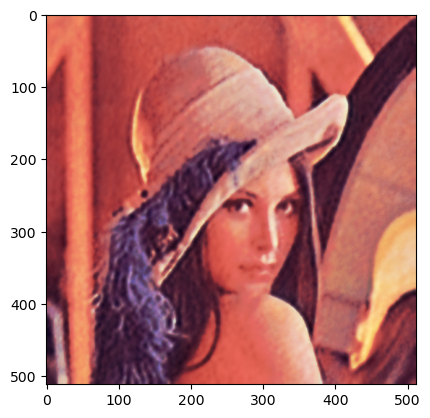

iterations: [230/1800]  loss: 0.014017  psnr_gt: 23.015530  psnr_noisy: 18.533446


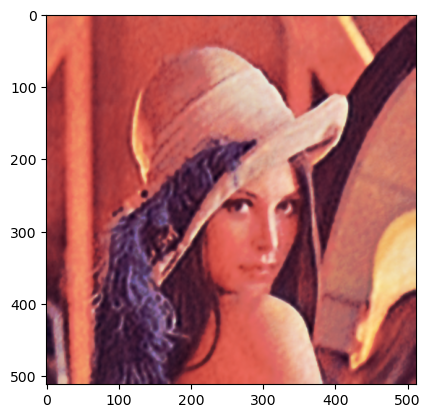

iterations: [240/1800]  loss: 0.013674  psnr_gt: 23.310533  psnr_noisy: 18.640913


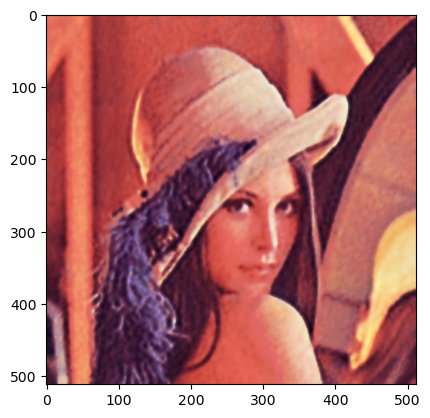

iterations: [250/1800]  loss: 0.013420  psnr_gt: 23.541803  psnr_noisy: 18.722395


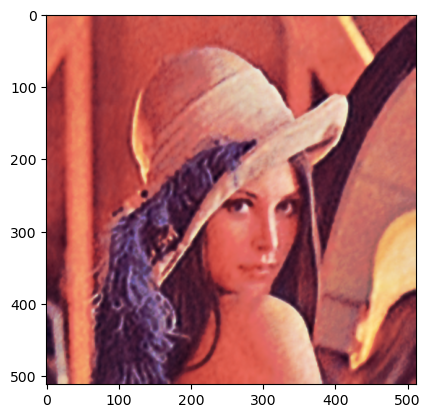

iterations: [260/1800]  loss: 0.013400  psnr_gt: 23.566709  psnr_noisy: 18.729053


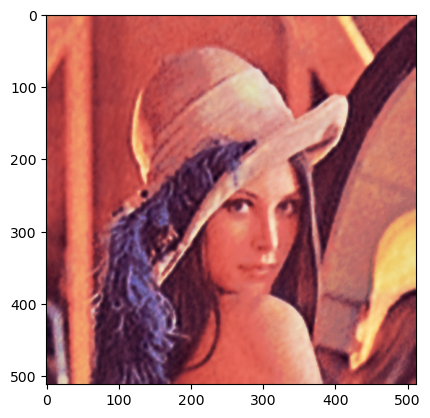

iterations: [270/1800]  loss: 0.013047  psnr_gt: 23.940950  psnr_noisy: 18.844794


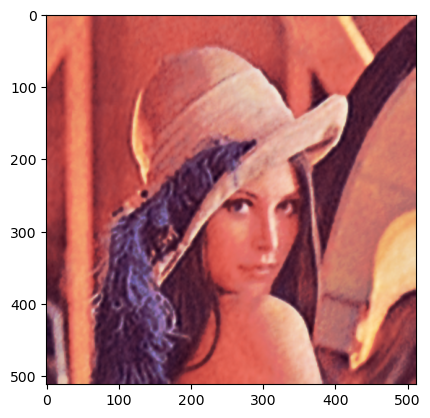

iterations: [280/1800]  loss: 0.012742  psnr_gt: 24.262571  psnr_noisy: 18.947726


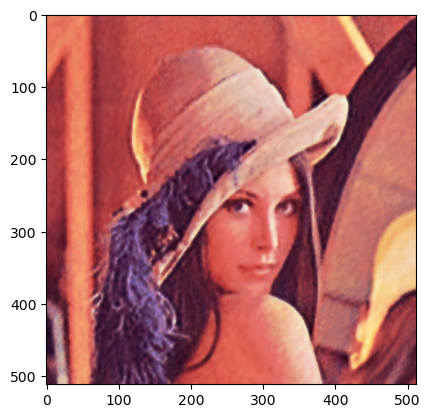

iterations: [290/1800]  loss: 0.012496  psnr_gt: 24.536526  psnr_noisy: 19.032319


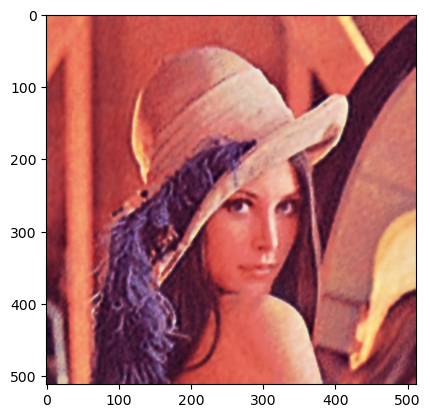

iterations: [300/1800]  loss: 0.012283  psnr_gt: 24.788551  psnr_noisy: 19.106810


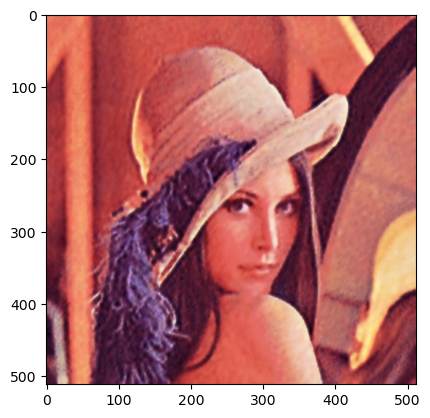

iterations: [310/1800]  loss: 0.012193  psnr_gt: 24.923930  psnr_noisy: 19.138739


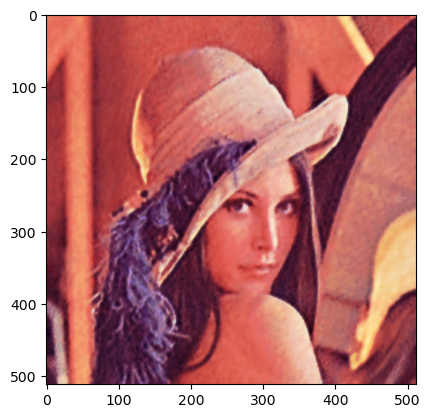

iterations: [320/1800]  loss: 0.011984  psnr_gt: 25.186094  psnr_noisy: 19.214095


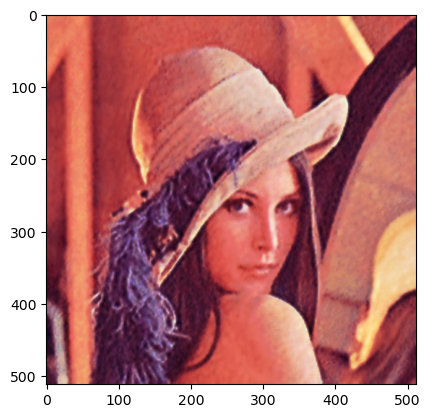

iterations: [330/1800]  loss: 0.011777  psnr_gt: 25.462412  psnr_noisy: 19.289493


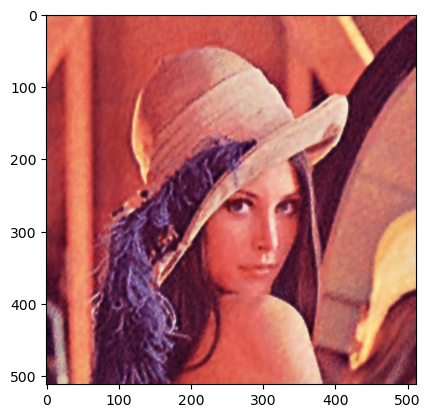

iterations: [340/1800]  loss: 0.011645  psnr_gt: 25.653865  psnr_noisy: 19.338419


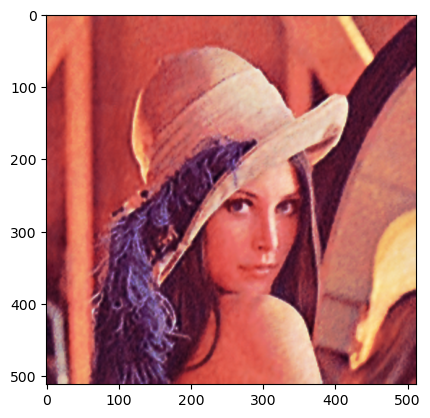

iterations: [350/1800]  loss: 0.011466  psnr_gt: 25.919985  psnr_noisy: 19.405758


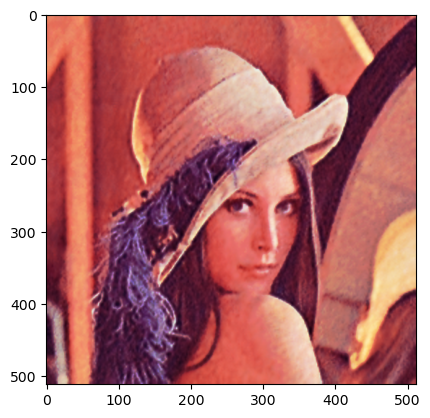

iterations: [360/1800]  loss: 0.011349  psnr_gt: 26.106252  psnr_noisy: 19.450535


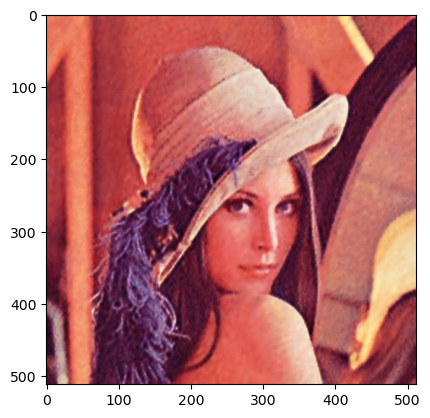

iterations: [370/1800]  loss: 0.011223  psnr_gt: 26.294311  psnr_noisy: 19.499049


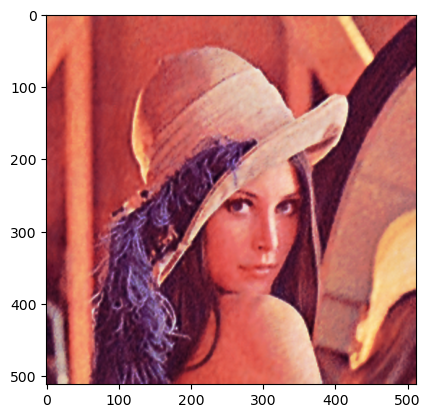

iterations: [380/1800]  loss: 0.011090  psnr_gt: 26.528835  psnr_noisy: 19.550861


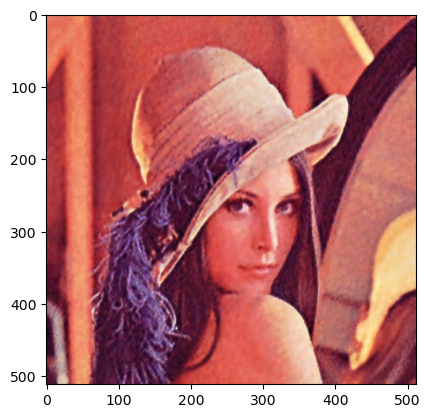

iterations: [390/1800]  loss: 0.011022  psnr_gt: 26.626144  psnr_noisy: 19.577571


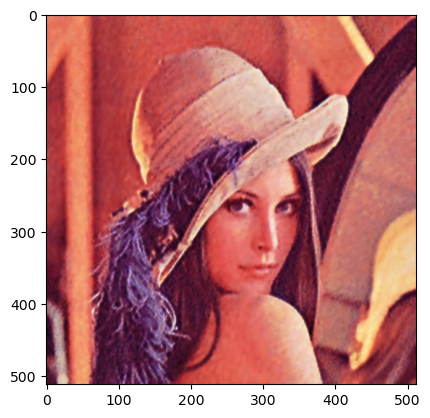

iterations: [400/1800]  loss: 0.010909  psnr_gt: 26.848105  psnr_noisy: 19.622315


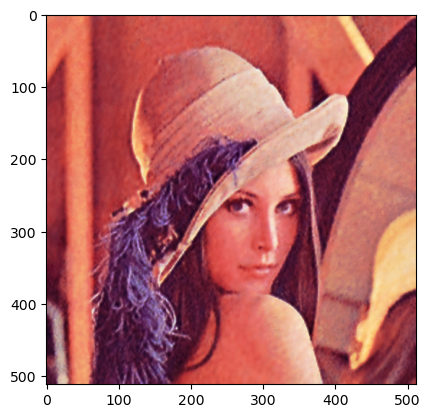

iterations: [410/1800]  loss: 0.010839  psnr_gt: 26.934042  psnr_noisy: 19.650054


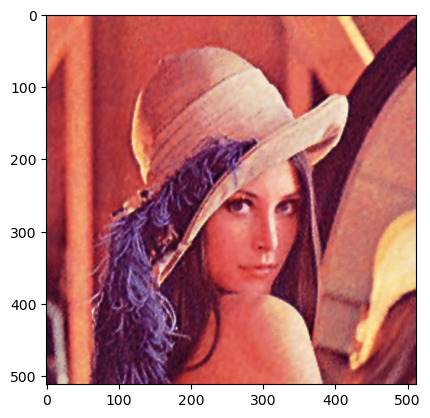

iterations: [420/1800]  loss: 0.010709  psnr_gt: 27.187146  psnr_noisy: 19.702599


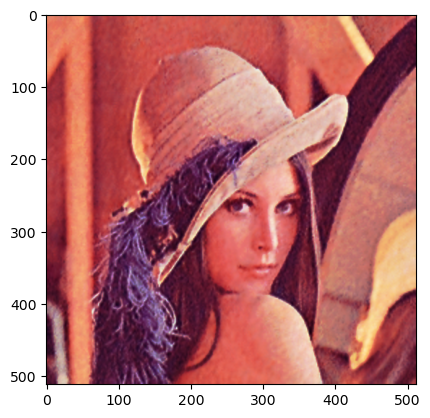

iterations: [430/1800]  loss: 0.010673  psnr_gt: 27.273754  psnr_noisy: 19.717097


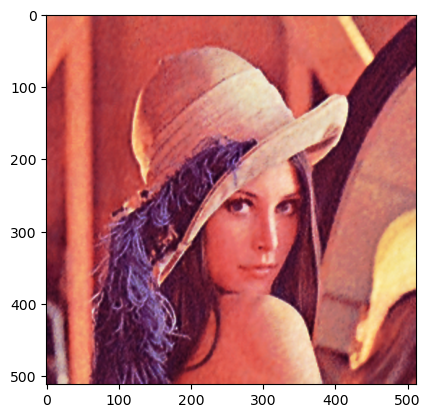

iterations: [440/1800]  loss: 0.010614  psnr_gt: 27.383113  psnr_noisy: 19.741075


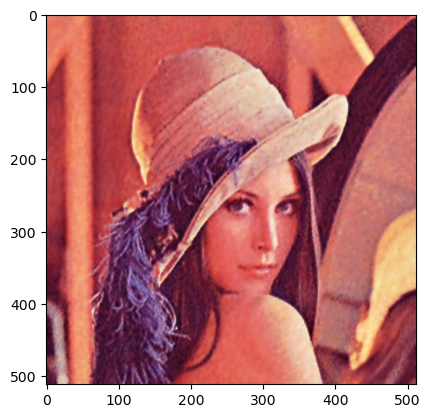

iterations: [450/1800]  loss: 0.010488  psnr_gt: 27.604969  psnr_noisy: 19.793052


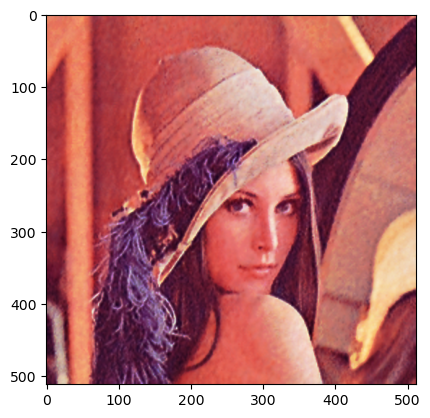

iterations: [460/1800]  loss: 0.010410  psnr_gt: 27.782389  psnr_noisy: 19.825473


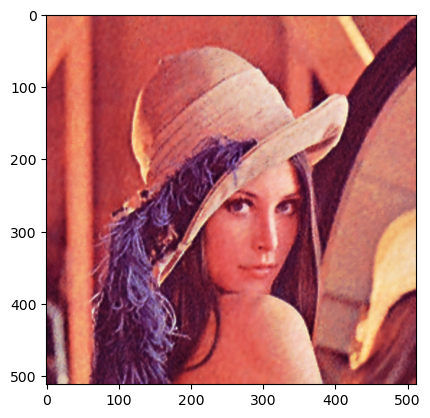

iterations: [470/1800]  loss: 0.010363  psnr_gt: 27.883298  psnr_noisy: 19.845296


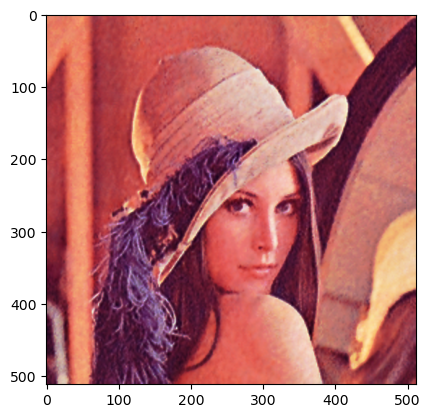

iterations: [480/1800]  loss: 0.010285  psnr_gt: 27.968573  psnr_noisy: 19.877945


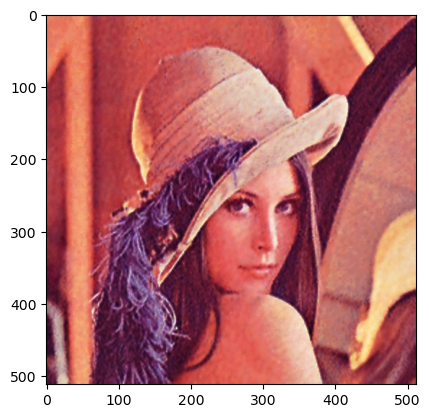

iterations: [490/1800]  loss: 0.010275  psnr_gt: 27.959850  psnr_noisy: 19.882309


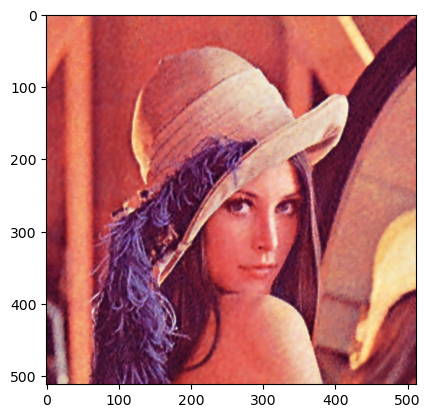

iterations: [500/1800]  loss: 0.010209  psnr_gt: 28.122474  psnr_noisy: 19.910306


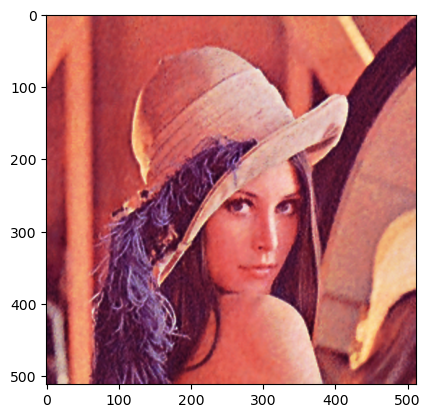

iterations: [510/1800]  loss: 0.010143  psnr_gt: 28.195728  psnr_noisy: 19.938237


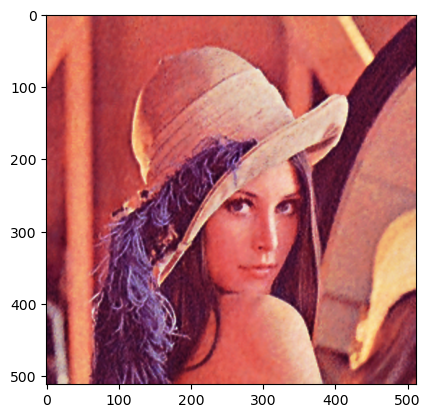

iterations: [520/1800]  loss: 0.010107  psnr_gt: 28.335201  psnr_noisy: 19.953654


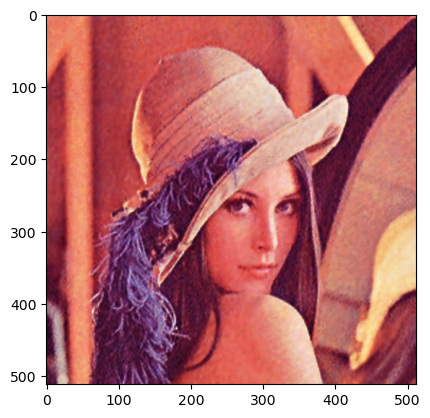

iterations: [530/1800]  loss: 0.010082  psnr_gt: 28.271731  psnr_noisy: 19.964359


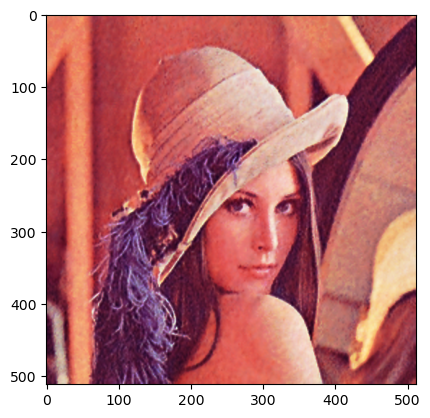

iterations: [540/1800]  loss: 0.010012  psnr_gt: 28.453494  psnr_noisy: 19.994968


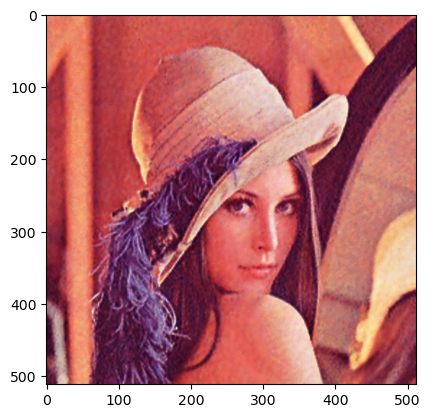

iterations: [550/1800]  loss: 0.010000  psnr_gt: 28.428588  psnr_noisy: 20.000199


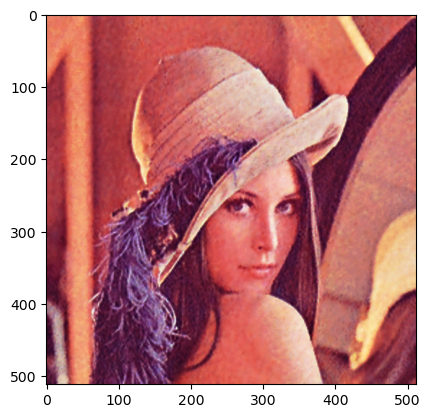

In [13]:
optimizer = optim.Adam(hg_net.parameters(), lr=lr)

# Lists to keep track of progress
img_list = []
losses = []
psnr_t_mat = []
psnr_n_mat = []
iters = 0

for i in range(max_iter):
    
    #z = z + sigma_p * torch.randn(1, nz, 512, 512, device=device)
    out = hg_net(z) # run z through the network
    loss = mse(out,x0)
    
    psnr_gt = psnr(x.detach().cpu().numpy()[0], out.detach().cpu().numpy()[0])
    psnr_noisy = psnr(x0.detach().cpu().numpy()[0], out.detach().cpu().numpy()[0])
    
    optimizer.zero_grad() # reset the gradients of model parameters
    loss.backward() # backpropagate the prediction loss
    optimizer.step() # adjust the parameters by the gradients
    
    # Save Losses for plotting later
    losses.append(loss.item())
    psnr_gt_mat.append(psnr_gt)
    psnr_n_mat.append(psnr_noisy)
    
    # Check how the network is doing
    if ((iters % 10 == 0) or (iters == max_iter-1)):
        with torch.no_grad():
            pred = out.detach().cpu()
            img_list.append(tv.utils.make_grid(pred, padding=2, normalize=True))
            print("iterations: [%d/%d]  loss: %f  psnr_gt: %f  psnr_noisy: %f" %(iters, max_iter, loss, psnr_gt, psnr_noisy))
            plt.imshow(np.moveaxis(img_list[-1].squeeze().detach().numpy(),0,-1))
            plt.show()
            if psnr_noisy >= 20:
                break
    
    iters += 1

### Save and load

In [14]:
#torch.save(hg_net, 'filename.pth')
#hg_net = torch.load('filename.pth')

In [15]:
img_out = np.moveaxis(img_list[-1].squeeze().detach().numpy(),0,-1)

### Plot

In [ ]:
plt.plot(losses)
plt.xlabel('iteration')
plt.title('MSE')
plt.show()

In [ ]:
plt.plot(psnr_t_mat, label='ground truth')
plt.plot(psnr_n_mat, label='noisy image')
plt.xlabel('iteration')
plt.legend(title='compared to')
plt.title('PSNR')
plt.show()